### Imports


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Task 1: Linear Regression with Non-Linear Basis Functions

# Data Generation

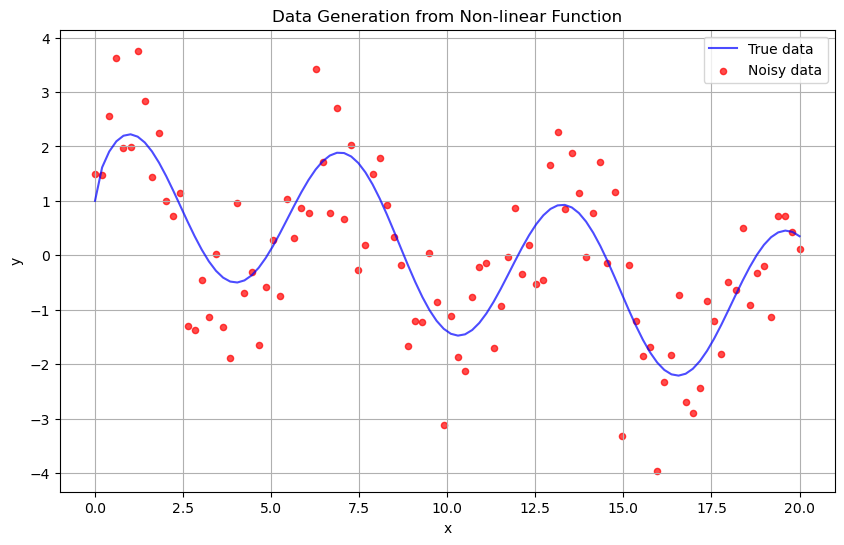

In [5]:

# Data generation
np.random.seed(42) 
n_points = 100
# x = np.random.uniform(0, 20, n_points)  # Sampling x uniformly from [0, 20]
x = np.linspace(0,20, n_points)
epsilon = np.random.normal(0, 1, n_points)  # Noise sampled from N(0, 1)

# Non-linear function
y_true = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)  # values from function
y_noisy = y_true + epsilon  # Adding Gaussian noise

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y_true, 'b-', label='True data', alpha=0.7)
plt.scatter(x, y_noisy, color='red', label='Noisy data', alpha=0.7, s=20)
plt.title('Data Generation from Non-linear Function')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True)
plt.show()

# Non-Linear Basis Function

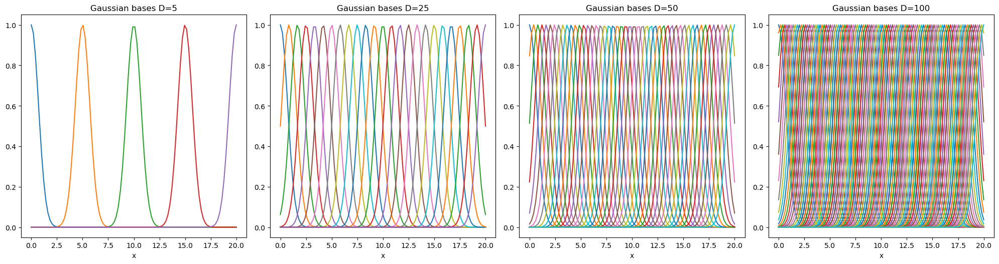

In [40]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

axs = axs.flatten()

i = 0
for D in [5, 25, 50, 100]:
    gaussian = lambda x,mu,sigma: np.exp(-((x-mu)/sigma)**2)          #non-linear feature function
    mu = np.linspace(0,20,D)                                          #different mean values for the non-linear features
    phi = gaussian(x[:,None], mu[None,:],1)                           #gives a new set of features of the existing data
    for b in range(D):
        axs[i].plot(x, phi[:,b], '-')
    
    axs[i].set_title(f'Gaussian bases D={D}')
    axs[i].set_xlabel('x')    
    i += 1

for j in range(i, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

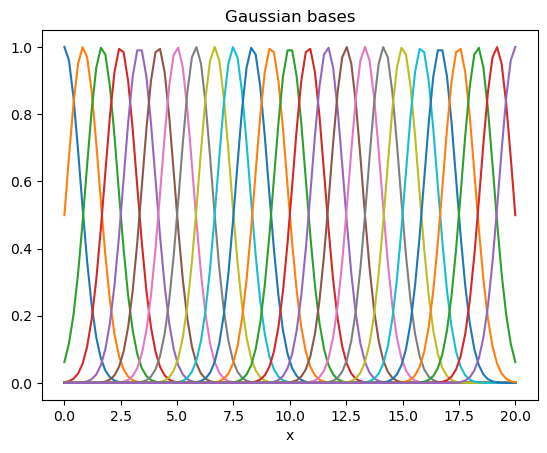

In [6]:
D=25
gaussian = lambda x,mu,sigma: np.exp(-((x-mu)/sigma)**2)          #non-linear feature function
mu = np.linspace(0,20,D)                                          #different mean values for the non-linear features
phi = gaussian(x[:,None], mu[None,:],1)                           #gives a new set of features of the existing data
for d in range(D):
    plt.plot(x, phi[:,d], '-')
plt.xlabel('x')
plt.title('Gaussian bases')
plt.show()

In [7]:
# aggregated func for gaussian basis
def gaussian_basis(x, lwr, upr, sigma, D):
    mu = np.linspace(lwr,upr,D)                                          #different mean values for the non-linear features
    phi = gaussian(x[:,None], mu[None,:],sigma)                           #gives a new set of features of the existing data
    return phi

# Model Fitting

In [8]:
class LinearRegression:
    def __init__(self, add_bias=True, fit_intercept=True, normalize=False):
        self.add_bias = add_bias
        self.fit_intercept = fit_intercept
        self.normalize = normalize
        pass

    def fit(self, x, y):
        """
        Fit the model and find the weights matrix w that optimizes the loss function.
        """

        if isinstance(x, pd.Series):
            x = x.to_numpy()
        if isinstance(y, pd.Series):
            y = y.to_numpy()

        if x.ndim == 1:
            x = x[:, None]
        if y.ndim == 1:
            y = y[:, None]
        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x,np.ones(N)])
        self.w = np.linalg.pinv(x).dot(y)

        return self

    def predict(self, x):
        if isinstance(x, pd.Series):
            x = x.to_numpy()
            
        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x,np.ones(N)])
        yh = x@self.w
        return pd.Series(yh.flatten())

    def MSE(self, y, yh):
        MSE = np.square(np.subtract(y,yh)).mean()
        return MSE
    
    def SSE(self, y, yh):
        MSE = np.square(np.subtract(y,yh)).sum()
        return MSE

    def score(self, X, y):
        y_pred = self.predict(X)
        return r2_score(y, y_pred)
    
    @property
    def intercept_(self):
        """
        Extracts the intercept of the fitted model.
        """
        if hasattr(self, 'w'):
            # Convert coefficients to list and return
            return self.w.flatten().tolist()[-1]
        else:
            raise ValueError("Model has not been fitted yet. Please call the 'fit' method before extracting intercept.")

    @property    
    def coef_(self):
        """
        Extracts the coefficients of the fitted model into a list.
        """
        if hasattr(self, 'w'):
            # Convert coefficients to list and return
            return self.w.flatten().tolist()[:-1]
        else:
            raise ValueError("Model has not been fitted yet. Please call the 'fit' method before extracting coefficients.")
        
    def get_params(self, deep=True):
        return {"fit_intercept": self.fit_intercept, "normalize": self.normalize}

    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self


In [9]:
# Fit a linear regression model using Gaussian basis functions with the following numbers of bases: [0, 10, 20, 30, ..., 100]
fitted_values1 = []
for d in range(0,101,10):
    phi_x = gaussian_basis(x=x, lwr=0, upr=20, sigma=1, D=d)
    lin_model = LinearRegression()
    lin_model.fit(phi_x,y_noisy)
    yh = lin_model.predict(phi_x)
    fitted_values1.append(yh)

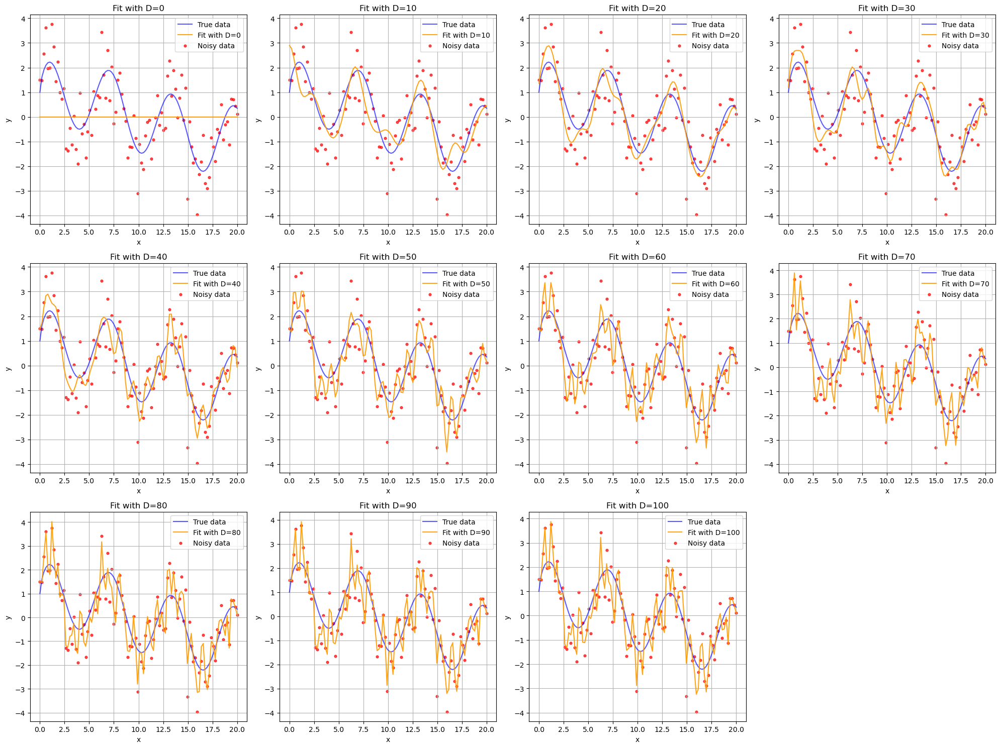

In [10]:
fig, axs = plt.subplots(3, 4, figsize=(20, 15))

axs = axs.flatten()

i = 0
for d in range(0, 101, 10):
    axs[i].plot(x, y_true, 'b-', label='True data', alpha=0.65)
    axs[i].plot(x, fitted_values1[i], color="#FF9B01", label=f'Fit with D={d}', alpha=0.9)
    axs[i].scatter(x, y_noisy, color='red', label='Noisy data', alpha=0.7, s=12)
    
    axs[i].set_title(f'Fit with D={d}')
    axs[i].set_xlabel('x')
    axs[i].set_ylabel('y')
    axs[i].legend()
    axs[i].grid(True)
    
    i += 1

for j in range(i, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

# Model Selection

In [11]:
x1_train, x1_val, y1_train, y1_val = train_test_split(x, y_noisy, train_size=0.8, test_size=0.2, random_state=6)

train1_ls = []
val1_ls = []

for d in range(0,101,10):
    phi_x1_train = gaussian_basis(x=x1_train, lwr=0, upr=20, sigma=1, D=d)
    phi_x1_val = gaussian_basis(x=x1_val, lwr=0, upr=20, sigma=1, D=d)

    lin_model = LinearRegression()
    lin_model.fit(phi_x1_train,y1_train)

    # yh for train
    yh1_train = lin_model.predict(phi_x1_train)
    train_sse1 = lin_model.SSE(y1_train, yh1_train)

    # yh for val
    yh1_val = lin_model.predict(phi_x1_val)
    val_sse1 = lin_model.SSE(y1_val, yh1_val)

    train1_ls.append(train_sse1)
    val1_ls.append(val_sse1)

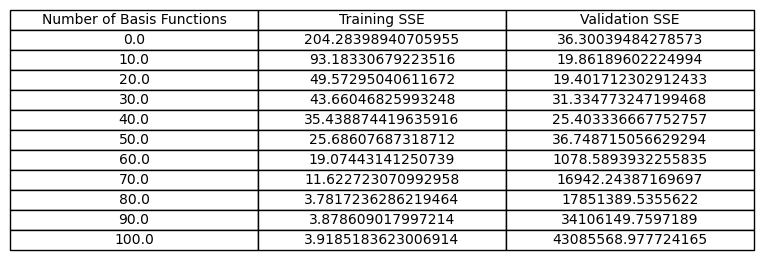

In [12]:
basis_range = list(range(0, 101, 10))  # 0, 10, 20, ..., 100

data = {
    'Number of Basis Functions': basis_range,
    'Training SSE': train1_ls,
    'Validation SSE': val1_ls
}

df_sse = pd.DataFrame(data)

fig, ax = plt.subplots(figsize=(8, 2))  

ax.axis('tight')
ax.axis('off')

table_data = df_sse.values.tolist()

table = ax.table(cellText=table_data,
                 colLabels=df_sse.columns,
                 cellLoc='center',
                 loc='center')

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.2)  

plt.show()


# Task 2: Bias-Variance Tradeoff with Multiple Fits

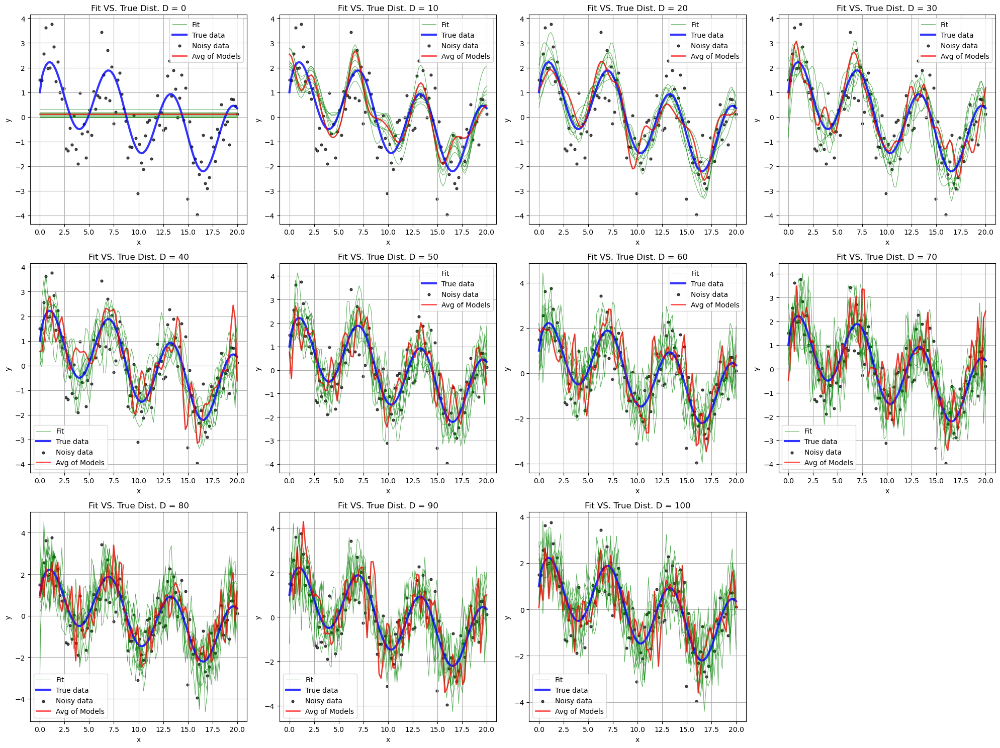

In [13]:
np.random.seed(42) 

fig, axs = plt.subplots(3, 4, figsize=(20, 15))

axs = axs.flatten()

for j, d in enumerate(range(0,101,10)):
    label_shown = False
    for i in range(10):
        n_points = 100
        epsilon = np.random.normal(0, 1, n_points)  # Noise sampled from N(0, 1)
        # Non-linear function
        sampled_y = y_true + epsilon  # Adding Gaussian noise
        fitted_values2 = []
    
        # fits
        phi_x = gaussian_basis(x=x, lwr=0, upr=20, sigma=1, D=d)
        lin_model = LinearRegression()
        lin_model.fit(phi_x,sampled_y)
        yh2 = lin_model.predict(phi_x)
        fitted_values2.append(yh2)
        if not label_shown:
            axs[j].plot(x, yh2, 'g-', alpha=0.65, linewidth=.7, label='Fit')
            label_shown = True  
        else:
            axs[j].plot(x, yh2, 'g-', alpha=0.65, linewidth=.7)

    axs[j].plot(x, y_true, 'b-', label='True data', alpha=0.8, linewidth=3)
    axs[j].scatter(x, y_noisy, color='black', label='Noisy data', alpha=0.7, s=12)
    axs[j].plot(x, pd.DataFrame(fitted_values2).T.mean(axis=1), color="red", label='Avg of Models', alpha=0.7, linewidth=2)

    axs[j].set_title(f'Fit VS. True Dist. D = {d}')
    axs[j].set_xlabel('x')
    axs[j].set_ylabel('y')
    axs[j].legend()
    axs[j].grid(True)

for j in range(11, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

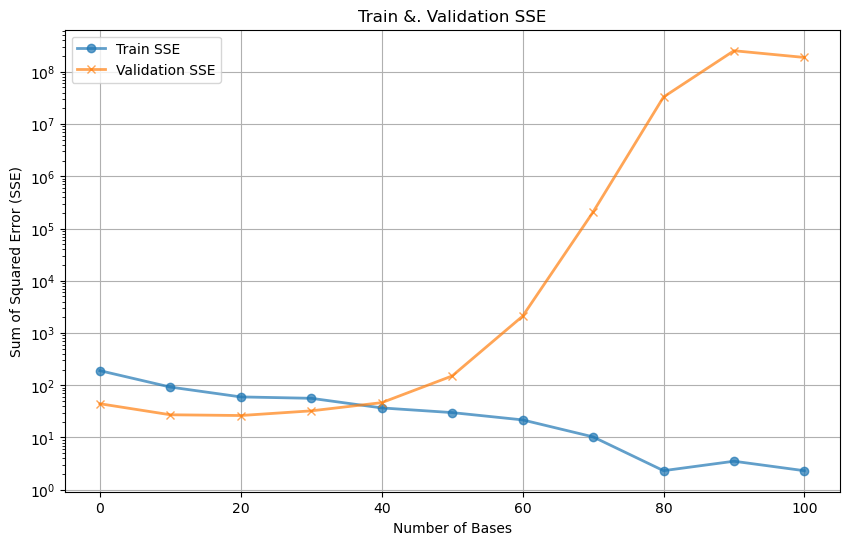

In [14]:
np.random.seed(42) 

train2_ls_lamda = []
val2_ls_lamda = []

axs = axs.flatten()
for j, d in enumerate(range(0,101,10)):
    train2_ls = []
    val2_ls = []
    for i in range(10):
        n_points = 100
        epsilon = np.random.normal(0, 1, n_points)  # Noise sampled from N(0, 1)
        # Non-linear function
        sampled_y = y_true + epsilon  # Adding Gaussian noise
        
        # SSE for train &. val
        x2_train, x2_val, y2_train, y2_val = train_test_split(x, sampled_y, train_size=0.8, test_size=0.2, random_state=6)

        phi_x2_train = gaussian_basis(x=x2_train, lwr=0, upr=20, sigma=1, D=d)
        phi_x2_val = gaussian_basis(x=x2_val, lwr=0, upr=20, sigma=1, D=d)

        lin_model = LinearRegression()
        lin_model.fit(phi_x2_train,y2_train)

        # yh for train
        yh2_train = lin_model.predict(phi_x2_train)
        train_sse2 = lin_model.SSE(y2_train, yh2_train)

        # yh for val
        yh2_val = lin_model.predict(phi_x2_val)
        val_sse2 = lin_model.SSE(y2_val, yh2_val)

        train2_ls.append(train_sse2)
        val2_ls.append(val_sse2)
    
    train2_ls_lamda.append(np.mean(train2_ls))
    val2_ls_lamda.append(np.mean(val2_ls))

plt.figure(figsize=(10, 6))
plt.plot(basis_range, train2_ls_lamda, label='Train SSE', marker='o', alpha=0.7, linewidth=2)
plt.plot(basis_range, val2_ls_lamda, label='Validation SSE', marker='x', alpha=0.7, linewidth=2)
plt.title('Train &. Validation SSE')
plt.xlabel('Number of Bases')
plt.ylabel('Sum of Squared Error (SSE)')
plt.yscale("log")
plt.legend()
plt.grid(True)
plt.show()

# Task 3: Regularization with Cross-Validation

In [15]:
class RegularizedLinearRegression:
    def __init__(self, add_bias=True, fit_intercept=True, normalize=False, regularization=None, lambda_=0.01):
        """
        regularization: 'L1' for Lasso, 'L2' for Ridge, or None for ordinary linear regression.
        lambda_: Regularization strength (lambda).
        """
        self.add_bias = add_bias
        self.fit_intercept = fit_intercept
        self.normalize = normalize
        self.regularization = regularization  # 'L1' or 'L2' or None
        self.lambda_ = lambda_
        pass

    def fit(self, x, y):
        """
        Fit the model and find the weights matrix w that optimizes the loss function.
        """
        if isinstance(x, pd.Series):
            x = x.to_numpy()
        if isinstance(y, pd.Series):
            y = y.to_numpy()

        if x.ndim == 1:
            x = x[:, None]
        if y.ndim == 1:
            y = y[:, None]
        N, D = x.shape

        if self.add_bias:
            x = np.column_stack([x, np.ones(N)])

        # L2 Regularization (Ridge)
        if self.regularization == 'L2':
            I = np.eye(x.shape[1])
            I[-1, -1] = 0  # Don't regularize the bias term
            A = x.T @ x + self.lambda_ * I
            b = x.T @ y
            self.w = np.linalg.pinv(A) @ b

        # L1 Regularization (Lasso) - simple gradient descent implementation
        elif self.regularization == 'L1':
            # Gradient Descent Parameters
            self.w = np.zeros((x.shape[1], 1))  # Initialize weights
            learning_rate = 0.0005  
            num_iterations = 5000  # Increase number of iterations for better convergence

            for _ in range(num_iterations):
                y_pred = x @ self.w
                gradient = x.T @ (y_pred - y)

                # Apply L1 regularization without the bias term
                l1_penalty = self.lambda_ * np.sign(self.w)
                l1_penalty[-1] = 0  # no bias term

                # Update weights with L1 penalty
                self.w -= learning_rate * (gradient + l1_penalty)

        # Ordinary Linear Regression (no regularization)
        else:
            self.w = np.linalg.pinv(x).dot(y)

        return self

    def predict(self, x):
        if isinstance(x, pd.Series):
            x = x.to_numpy()

        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x, np.ones(N)])
        yh = x @ self.w
        return pd.Series(yh.flatten())

    def MSE(self, y, yh):
        return np.mean(np.square(np.subtract(y, yh)))

    def SSE(self, y, yh):
        return np.sum(np.square(np.subtract(y, yh)))

    def score(self, X, y):
        y_pred = self.predict(X)
        return r2_score(y, y_pred)

    @property
    def intercept_(self):
        """
        Extracts the intercept of the fitted model.
        """
        if hasattr(self, 'w'):
            # Convert coefficients to list and return
            return self.w.flatten().tolist()[-1]
        else:
            raise ValueError("Model has not been fitted yet. Please call the 'fit' method before extracting intercept.")

    @property
    def coef_(self):
        """
        Extracts the coefficients of the fitted model into a list.
        """
        if hasattr(self, 'w'):
            # Convert coefficients to list and return
            return self.w.flatten().tolist()[:-1]
        else:
            raise ValueError("Model has not been fitted yet. Please call the 'fit' method before extracting coefficients.")

    def get_params(self, deep=True):
        return {"fit_intercept": self.fit_intercept, "normalize": self.normalize, "regularization": self.regularization, "lambda_": self.lambda_}

    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

## Train VS. Val Error PLot for L1 &. L2 Reg

In [16]:
from sklearn.model_selection import KFold

def cross_validation(model, X, y, lambdas, regularization, num_folds=10):
    # List to store training and validation MSE for each lambda
    train_mse_list = []
    val_mse_list = []
    
    # Set up K-Fold cross-validation
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
    
    for lambda_ in lambdas:
        train_mse = []
        val_mse = []

        # Loop through each fold
        for train_index, val_index in kf.split(X):
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]
            
            # Set the lambda (regularization strength) in the model
            model.lambda_ = lambda_
            model.regularization = regularization
            
            # Train the model on the training set
            model.fit(X_train, y_train)
            
            # Predict on the training and validation sets
            y_train_pred = model.predict(X_train)
            y_val_pred = model.predict(X_val)
            
            # Compute MSE for both training and validation sets
            train_mse.append(model.MSE(y_train, y_train_pred))
            val_mse.append(model.MSE(y_val, y_val_pred))

        # Average MSE over the 10 folds for the current lambda
        train_mse_list.append(np.mean(train_mse))
        val_mse_list.append(np.mean(val_mse))

    return train_mse_list, val_mse_list


In [17]:
def dataset_generation(num_datasets=50, N=20, D=70, noise_variance=1.0):
    dataset = []

    # X generation
    X = np.linspace(0,20, N)
    phi_x = gaussian_basis(X, lwr=0, upr=20, sigma=noise_variance, D=D)

    # generate num_datasets of datasets
    for _ in range(num_datasets):
        epsilon = np.random.normal(0, 1, N)  # Noise sampled from N(0, 1)
        # Non-linear function
        y_true = np.sin(np.sqrt(X)) + np.cos(X) + np.sin(X)  # values from function
        y_generated = y_true + epsilon  # Adding Gaussian noise
        dataset.append(y_generated)

    return dataset, phi_x

# generate 50 datasets
np.random.seed(42) 
datasets, phi_x3 = dataset_generation(num_datasets=50, N=20, D=70, noise_variance=1.0)

In [18]:
lambdas = np.logspace(-4, 2, 15)

train_mse_L1_ls = []
val_mse_L1_ls = []
train_mse_L2_ls = []
val_mse_L2_ls = []

for y in datasets:
    # model initilize
    model = RegularizedLinearRegression()

    # run k=10 cv, L1
    train_mse_L1, val_mse_L1 = cross_validation(model, phi_x3, y, lambdas, regularization='L1', num_folds=10)
    train_mse_L1_ls.append(train_mse_L1)
    val_mse_L1_ls.append(val_mse_L1)

    # model initilize
    model = RegularizedLinearRegression()

    # run k=10 cv, L2
    train_mse_L2, val_mse_L2 = cross_validation(model, phi_x3, y, lambdas, regularization='L2', num_folds=10)
    train_mse_L2_ls.append(train_mse_L2)
    val_mse_L2_ls.append(val_mse_L2)

In [19]:
# compute avgs
train_mse_L1_series = pd.DataFrame(train_mse_L1_ls).T.mean(axis=1)
val_mse_L1_series = pd.DataFrame(val_mse_L1_ls).T.mean(axis=1)
train_mse_L2_series = pd.DataFrame(train_mse_L2_ls).T.mean(axis=1)
val_mse_L2_series = pd.DataFrame(val_mse_L2_ls).T.mean(axis=1)


In [25]:
print(f"The optimal lamda for L1 is {lambdas[val_mse_L1_series.idxmin()]}")
print(f"The optimal lamda for L2 is {lambdas[val_mse_L2_series.idxmin()]}")

The optimal lamda for L1 is 0.2682695795279725
The optimal lamda for L2 is 1.9306977288832496


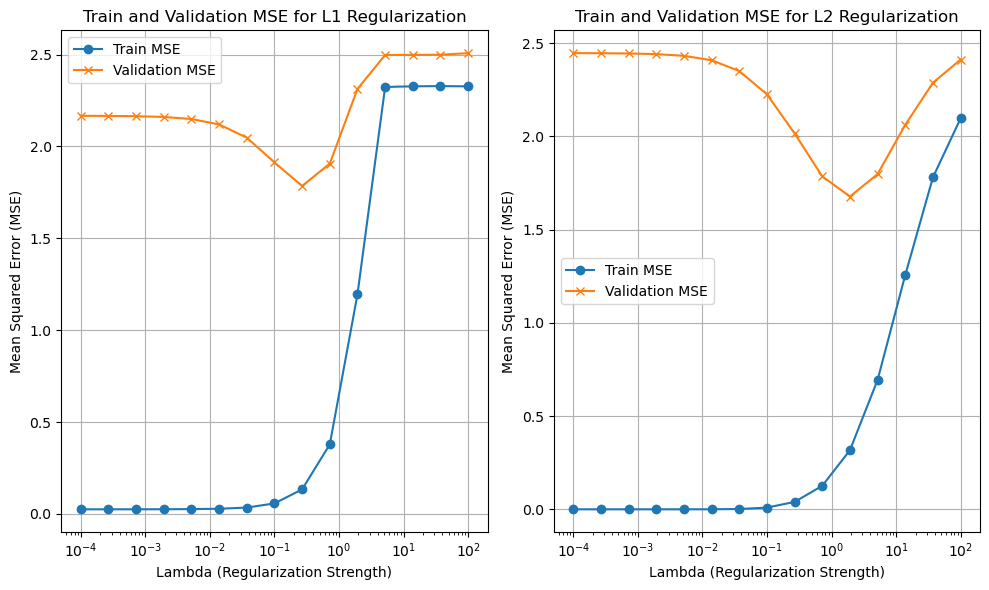

In [20]:
# plot 
fig, axs = plt.subplots(1, 2, figsize=(10, 6))

axs = axs.flatten()

axs[0].plot(lambdas, train_mse_L1_series, label='Train MSE', marker='o')
axs[0].plot(lambdas, val_mse_L1_series, label='Validation MSE', marker='x')
axs[0].set_xscale('log')
axs[0].set_xlabel('Lambda (Regularization Strength)')
axs[0].set_ylabel('Mean Squared Error (MSE)')
axs[0].set_title('Train and Validation MSE for L1 Regularization')
axs[0].legend()
axs[0].grid(True)

axs[1].plot(lambdas, train_mse_L2_series, label='Train MSE', marker='o')
axs[1].plot(lambdas, val_mse_L2_series, label='Validation MSE', marker='x')
axs[1].set_xscale('log')
axs[1].set_xlabel('Lambda (Regularization Strength)')
axs[1].set_ylabel('Mean Squared Error (MSE)')
axs[1].set_title('Train and Validation MSE for L2 Regularization')
axs[1].legend()
axs[1].grid(True)
    

plt.tight_layout()
plt.show()

In [181]:
def bias_var_cv(model, X, y, lambdas, regularization, num_folds=10):
    predictions_dict = {lambda_: {'preds': [], 'true': y} for lambda_ in lambdas}
    
    # k-fold split
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
    
    # For each lambda value
    for lambda_ in lambdas:
        fold_preds = []
        
        # For each fold
        for train_index, val_index in kf.split(X):
            X_train_fold, _ = X[train_index], X[val_index]
            y_train_fold, _ = y[train_index], y[val_index]
            
            # Set the regularization parameter
            model.lambda_ = lambda_
            model.regularization = regularization
            
            # Fit the model on the training fold
            model.fit(X_train_fold, y_train_fold)
            
            # Predict on the entire dataset to get multiple predictions per data point
            y_pred = model.predict(X)
            fold_preds.append(y_pred)
        
        # Store predictions across folds
        predictions_dict[lambda_]['preds'] = fold_preds  # List of predictions on X for all folds
    
    return predictions_dict

In [223]:
def bias_var(model, X, lambdas, regularization, datasets):

    decomposition_dict = {'bias2': [], 'variance2': []}

    # For each lambda value
    for lambda_ in lambdas:
        preds = []

        for data in datasets:
            # train-test split
            x_train, _, y_train, _ = train_test_split(X, data, train_size=0.8, test_size=0.2, random_state=6)
                
            # Set the regularization parameter
            model.lambda_ = lambda_
            model.regularization = regularization
                
            # Fit the model on the training fold
            model.fit(x_train, y_train)
                
            # Predict on the entire dataset to get multiple predictions per data point
            y_pred = model.predict(X)
            preds.append(y_pred)

        preds_array = np.array(preds)
        mean_preds = np.mean(preds_array, axis=0)
        variance_per_point = np.mean((preds_array - mean_preds) ** 2, axis=0)
        variance = np.mean(variance_per_point)

        bias_squared_list = []
        for data in datasets:
            bias_squared_per_point = (mean_preds - data) ** 2
            bias_squared = np.mean(bias_squared_per_point)
            bias_squared_list.append(bias_squared)
        
        bias_squared = np.mean(bias_squared_list)
        
        # Store values across lamdas
        decomposition_dict['bias2'].append(bias_squared)   
        decomposition_dict['variance2'].append(variance)   

    
    return decomposition_dict

In [193]:
def compute_bias_variance(predictions_dict, lambdas):
    bias_squared_list = []
    variance_list = []
    total_error_list = []
    
    y_true = predictions_dict[lambdas[0]]['true']
    
    for lambda_ in lambdas:
        data = predictions_dict[lambda_]
        preds = data['preds']
        preds_array = np.array(preds)
        
        mean_preds = np.mean(preds_array, axis=0)
        variance_per_point = np.mean((preds_array - mean_preds) ** 2, axis=0)
        variance = np.mean(variance_per_point)
        
        bias_squared_per_point = (mean_preds - y_true) ** 2
        bias_squared = np.mean(bias_squared_per_point)
        
        errors = preds_array - y_true  # Shape: (num_folds, num_samples)
        squared_errors = errors ** 2   # Shape: (num_folds, num_samples)
        total_error = np.mean(squared_errors)
        
        # Append results
        bias_squared_list.append(bias_squared)
        variance_list.append(variance)
        total_error_list.append(total_error)
        
    return bias_squared_list, variance_list, total_error_list

In [194]:
results = {'L1': {'bias_squared': [], 'variance': [], 'total_error': [], 'lambdas': lambdas},
           'L2': {'bias_squared': [], 'variance': [], 'total_error': [], 'lambdas': lambdas}}

for regularization in ['L1', 'L2']:
    bias_squared_all = []
    variance_all = []
    total_error_all = []
    
    # Loop over each dataset
    for dataset in datasets:
        
        # Initialize the model
        model = RegularizedLinearRegression()
        
        # Collect predictions using k-fold CV
        predictions_dict = bias_var_cv(model, X=phi_x3, y=dataset, lambdas=lambdas, regularization=regularization, num_folds=10)
        
        # Compute bias and variance
        bias_squared_list, variance_list, total_error_list = compute_bias_variance(predictions_dict, lambdas)
        
        # Collect results
        bias_squared_all.append(bias_squared_list)
        variance_all.append(variance_list)
        total_error_all.append(total_error_list)
    
    # Convert lists to numpy arrays for averaging
    bias_squared_all = np.array(bias_squared_all)  # Shape: (num_datasets, num_lambdas)
    variance_all = np.array(variance_all)
    total_error_all = np.array(total_error_all)
    
    # Compute averages across all datasets
    avg_bias_squared = np.mean(bias_squared_all, axis=0)
    avg_variance = np.mean(variance_all, axis=0)
    avg_total_error = np.mean(total_error_all, axis=0)
    
    # Store results
    results[regularization]['bias_squared'] = avg_bias_squared
    results[regularization]['variance'] = avg_variance
    results[regularization]['total_error'] = avg_total_error

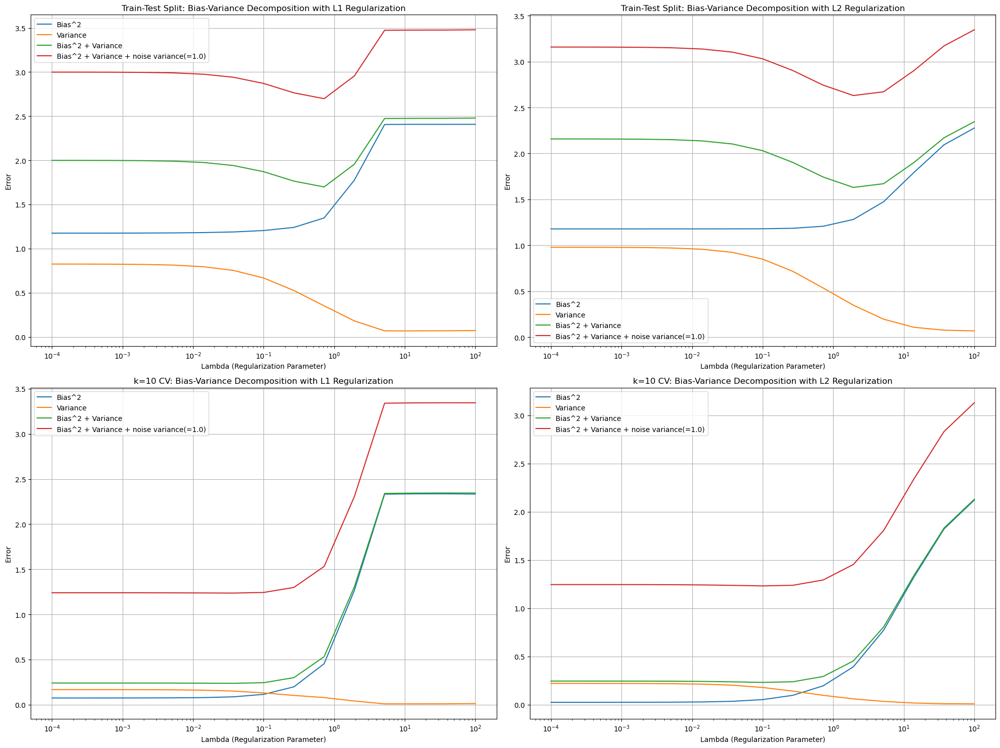

In [231]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

axs = axs.flatten()

# train test split
model = RegularizedLinearRegression()
for i in range(0,4,2):
    if i == 0:
        for regularization in ['L1', 'L2']:
            decomposition_dict = bias_var(model, phi_x3, lambdas, regularization, datasets)

            axs[i].plot(lambdas, decomposition_dict['bias2'], label='Bias^2')
            axs[i].plot(lambdas, decomposition_dict['variance2'], label='Variance')
            axs[i].plot(lambdas, np.array(decomposition_dict['bias2'])+np.array(decomposition_dict['variance2']), label='Bias^2 + Variance')
            axs[i].plot(lambdas, np.array(decomposition_dict['bias2'])+np.array(decomposition_dict['variance2'])+1, label='Bias^2 + Variance + noise variance(=1.0)')

            axs[i].set_xscale('log')
            axs[i].set_title(f'Train-Test Split: Bias-Variance Decomposition with {regularization} Regularization')
            axs[i].set_xlabel('Lambda (Regularization Parameter)')
            axs[i].set_ylabel('Error')
            axs[i].legend()
            axs[i].grid(True)

            i = i+1
    elif i ==2:
        for regularization in ['L1', 'L2']:
            bias_squared = results[regularization]['bias_squared']
            variance = results[regularization]['variance']
            total_error = results[regularization]['total_error']
            bias_variance_sum = bias_squared + variance

            axs[i].plot(lambdas, bias_squared, label='Bias^2')
            axs[i].plot(lambdas, variance, label='Variance')
            axs[i].plot(lambdas, bias_variance_sum, label='Bias^2 + Variance')
            axs[i].plot(lambdas, bias_variance_sum+1, label='Bias^2 + Variance + noise variance(=1.0)')
            axs[i].set_xscale('log')
            axs[i].set_title(f'k=10 CV: Bias-Variance Decomposition with {regularization} Regularization')
            axs[i].set_xlabel('Lambda (Regularization Parameter)')
            axs[i].set_ylabel('Error')
            axs[i].legend()
            axs[i].grid(True)

            i = i+1

# for j in range(10, len(axs)):
#     fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

# Task 4: Effect of L1 and L2 Regularization on Loss

## Generating Synthetic Data

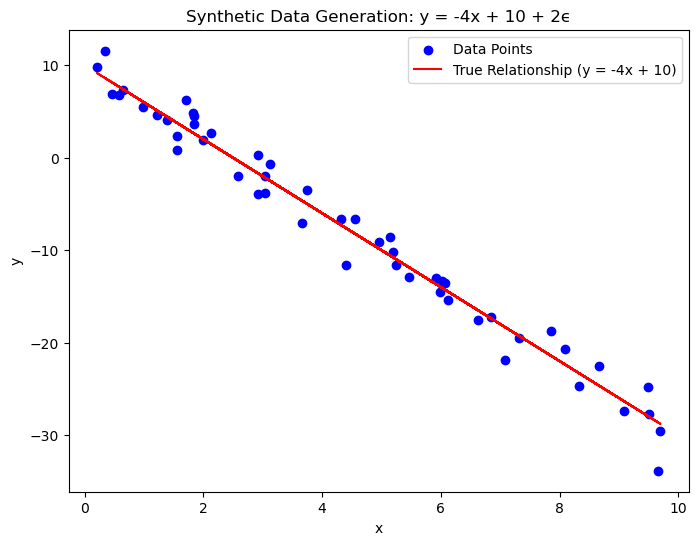

In [41]:
np.random.seed(42)  

# sample x uniformly from [0,10]
x2 = np.random.uniform(0, 10, 50)

# Generate the Gaussian noise with mean 0 and variance 1
epsilon2 = np.random.normal(0, 1, 50)

# Apply the linear relationship: y = -4x + 10 + 2 * epsilon
y2 = -4 * x2 + 10 + 2 * epsilon2

# Plot the generated data points
plt.figure(figsize=(8, 6))
plt.scatter(x2, y2, color='blue', label='Data Points')
plt.plot(x2, -4 * x2 + 10, color='red', label='True Relationship (y = -4x + 10)')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Synthetic Data Generation: y = -4x + 10 + 2ϵ')
plt.legend()
plt.show()


## Applying L1 and L2 Regularization

In [65]:
class GradientDescent:
    def __init__(self, learning_rate=.0001, max_iters=1e5, epsilon=1e-8, record_history=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.record_history = record_history
        self.epsilon = epsilon
        if record_history:
            self.w_history = []

    def run(self, gradient_fn, x, y, w):
        grad = np.inf
        t = 1
        while np.linalg.norm(grad) > self.epsilon and t < self.max_iters:
            grad = gradient_fn(x, y, w)
            w = w - self.learning_rate * grad
            if self.record_history:
                self.w_history.append(w)
            t += 1
        return w

class LinearRegression:
    def __init__(self, add_bias=True, l2_reg=0, l1_reg=0):
        self.add_bias = add_bias
        self.l2_reg = l2_reg
        self.l1_reg = l1_reg  # Add L1 regularization parameter

    def fit(self, x, y, optimizer, regularization='L2'):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x, np.ones(N)])  # Adding bias term

        def gradient(x, y, w):
            yh = x @ w
            grad = .5 * np.dot(yh - y, x) / x.shape[0]
            
            if regularization == 'L2':
                grad += self.l2_reg * w  # L2 regularization term
            elif regularization == 'L1':
                grad += self.l1_reg * np.sign(w)  # L1 regularization term
            return grad

        w0 = np.zeros(x.shape[1])
        self.w = optimizer.run(gradient, x, y, w0)
        return self


## Plotting the Loss Function

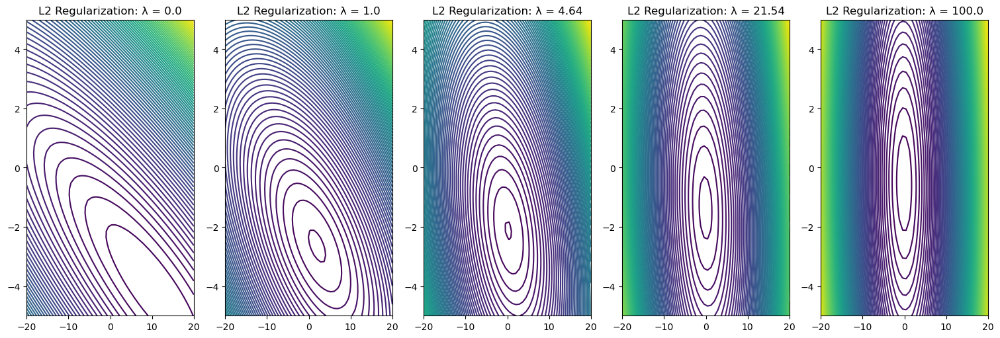

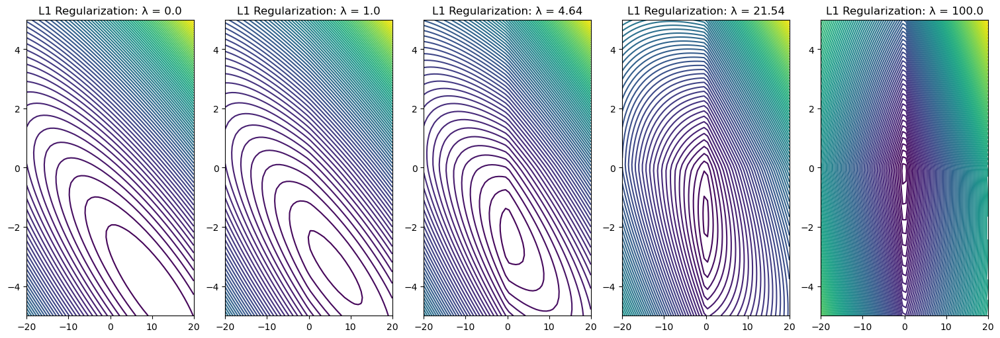

In [52]:
import itertools

# Function to plot contours of the loss function
def plot_contour(f, x1bound, x2bound, resolution, ax):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i, j in itertools.product(range(resolution), range(resolution)):
        zg[i, j] = f([xg[i, j], yg[i, j]])
    ax.contour(xg, yg, zg, 100)
    return ax


# L2 Regularization (Ridge)
cost_l2 = lambda w, reg: .5 * np.mean((w[0] + w[1]*x2 - y2)**2) + reg*np.dot(w, w)/2

# L1 Regularization (Lasso)
cost_l1 = lambda w, reg: .5 * np.mean((w[0] + w[1]*x2 - y2)**2) + reg * np.sum(np.abs(w))

# Regularization strengths to visualize
# reg_list = np.logspace(-2, 1, 5)  # Different regularization strengths
reg_list = np.logspace(0, 2, 4)
reg_list = np.concatenate(([0], reg_list))

# Plot L2 (Ridge) Regularization Contours
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):
    current_cost = lambda w: cost_l2(w, reg_coef)
    plot_contour(current_cost, [-20, 20], [-5, 5], 50, axes[i])
    axes[i].set_title(f'L2 Regularization: λ = {round(reg_coef,2)}')  # Clearly mark as L2
plt.show()

# Plot L1 (Lasso) Regularization Contours
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):
    current_cost = lambda w: cost_l1(w, reg_coef)
    plot_contour(current_cost, [-20, 20], [-5, 5], 50, axes[i])
    axes[i].set_title(f'L1 Regularization: λ = {round(reg_coef,2)}')  # Clearly mark as L1
plt.show()


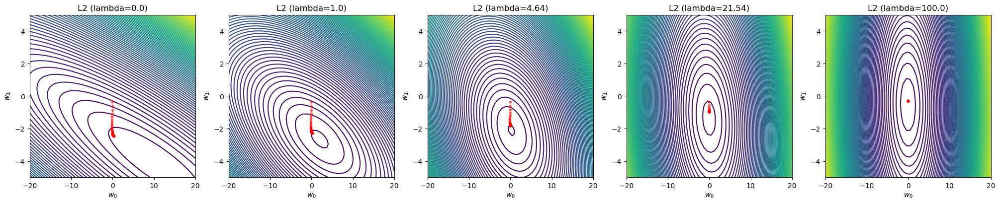

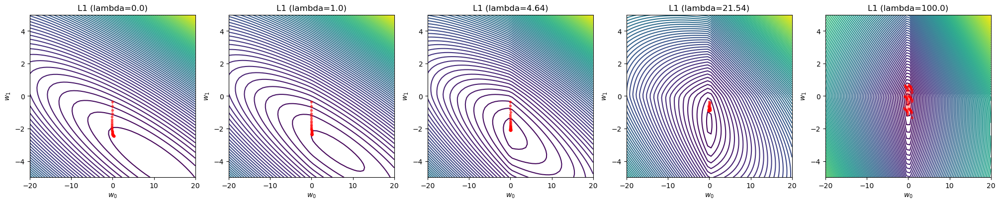

In [69]:
# contour plots with optimization path
cost = lambda w, reg_l2, reg_l1: .5*np.mean((w[0] + w[1]*x2 - y2)**2) + reg_l2*np.dot(w,w)/2 + reg_l1*np.sum(np.abs(w))

fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(20, 4))
axs = axs.flatten()

# Plotting for L2 Regularization (Ridge)
for i, reg_coef in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_history=True)
    model = LinearRegression(l2_reg=reg_coef)
    model.fit(x2, y2, optimizer)
    current_cost = lambda w: cost(w, reg_coef, 0)
    plot_contour(current_cost, [-20, 20], [-5, 5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)  # T x 2
    axes[i].plot(w_hist[:, 1], w_hist[:, 0], '.r', alpha=.5)
    axes[i].plot(w_hist[:, 1], w_hist[:, 0], '-r', alpha=.3)
    axes[i].set_title(f'L2 (lambda={round(reg_coef,2)})')
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')

plt.show()

fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(20, 4))
axs = axs.flatten()    
# Plotting for L1 Regularization (Lasso)
for i, reg_coef in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_history=True)
    model = LinearRegression(l1_reg=reg_coef)
    model.fit(x2, y2, optimizer, regularization='L1')
    current_cost = lambda w: cost(w, 0, reg_coef)
    plot_contour(current_cost, [-20, 20], [-5, 5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)  # T x 2
    axes[i].plot(w_hist[:, 1], w_hist[:, 0], '.r', alpha=.5)
    axes[i].plot(w_hist[:, 1], w_hist[:, 0], '-r', alpha=.3)
    axes[i].set_title(f'L1 (lambda={round(reg_coef,2)})')
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')

plt.show()


## Adam for Reguarlization

In [63]:
# regularization class with adam
class LinearRegression:
    def __init__(self, reg='', lambda_reg=0.01, learning_rate=1e-3, max_iters=1e5, epsilon=1e-8, beta_1=0.9, beta_2=0.999, debug=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.epsilon = epsilon
        self.beta_1 = beta_1
        self.beta_2 = beta_2
        self.debug = debug
        self.reg = reg
        self.lambda_reg = lambda_reg
        self.w_hist = []
        pass
    
    def gradient(self, x, y, w):
        N, D = x.shape
        yh = np.dot(x, w)
        cost = yh - y
        
        grad = np.dot(x.T, cost) / N
        if self.reg == 'l2':
            grad += self.lambda_reg * w
        elif self.reg == 'l1': 
            grad += self.lambda_reg * np.sign(w)
            
        return grad
        
    def fit(self, x, y):
        
        N = x.shape[0]
        x = np.column_stack([x,np.ones(N)]) 
    
        grad = np.inf
        t = 1
        w = np.zeros(x.shape[1]) 
        m = np.zeros_like(w)  # First moment vector
        s = np.zeros_like(w)  # Second moment vector
        while np.linalg.norm(grad) > self.epsilon and t < self.max_iters:
            grad = self.gradient(x, y, w)
            m = self.beta_1 * m + (1 - self.beta_1) * grad
            s = self.beta_2 * s + (1 - self.beta_2) * (grad ** 2)
            m_hat = m / (1 - self.beta_1 ** t)
            s_hat = s / (1 - self.beta_2 ** t)
            w = w - self.learning_rate * m_hat / (np.sqrt(s_hat) + self.epsilon)
            self.w_hist.append(w.copy())
            t += 1

        if self.debug:
            print(f"Terminated ADAM after {t} iterations with gradient: {np.linalg.norm(grad)}.")
            
        self.w_opt = w
    
    def predict(self, x):
        
        N = x.shape[0]
        x = np.column_stack([x,np.ones(N)]) 

        yh = x @ self.w_opt
        return yh

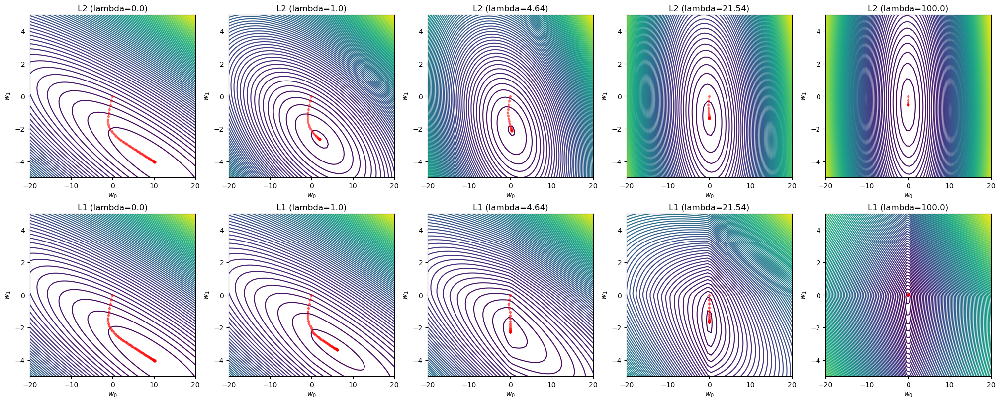

In [64]:
# plots with adam
cost = lambda w, reg: .5*np.mean((w[0] + w[1]*x2 - y2)**2) + reg*np.dot(w,w)/2

fig, axes = plt.subplots(ncols=len(reg_list), nrows=2, constrained_layout=True, figsize=(20, 8))

for i, reg_coef in enumerate(reg_list):
    model = LinearRegression(reg='l2', lambda_reg=reg_coef)
    model.fit(x2, y2)
    
    current_cost = lambda w: cost(w, reg_coef)
    
    plot_contour(current_cost, [-20, 20], [-5, 5], 50, axes[0, i])
    
    w_hist = np.vstack(model.w_hist)
    w_hist = w_hist[::300]
    
    axes[0,i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=0.4)
    axes[0,i].plot(w_hist[:, 1], w_hist[:, 0], '-r', alpha=.3)

    
    axes[0,i].set_xlabel(r'$w_0$')
    axes[0,i].set_ylabel(r'$w_1$')
    
    axes[0,i].set_title(f'L2 (lambda={round(reg_coef,2)})')
    
    axes[0,i].set_xlim([-20,20])
    axes[0,i].set_ylim([-5,5])

cost = lambda w, reg: .5*np.mean((w[0] + w[1]*x2 - y2)**2) + reg*np.sum(np.abs(w))

for i, reg_coef in enumerate(reg_list):
    model = LinearRegression(reg='l1', lambda_reg=reg_coef)
    model.fit(x2, y2)
    
    current_cost = lambda w: cost(w, reg_coef)
    
    plot_contour(current_cost, [-20,20], [-5,5], 50, axes[1, i])
    
    w_hist = np.vstack(model.w_hist)
    w_hist = w_hist[::300]
    
    axes[1,i].plot(w_hist[:,1], w_hist[:,0], '.r', lw=0.001, alpha=.5)
    axes[1,i].plot(w_hist[:, 1], w_hist[:, 0], '-r', alpha=.3)

    axes[1,i].set_xlabel(r'$w_0$')
    axes[1,i].set_ylabel(r'$w_1$')
    
    axes[1,i].set_title(f'L1 (lambda={round(reg_coef,2)})')
    
    axes[1,i].set_xlim([-20,20])
    axes[1,i].set_ylim([-5,5])
    
    
plt.show()